### Load Predictions and convenience methods

In [1]:
import pandas as pd
import matplotlib
import warnings
import os
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import analysis_utils
from copy import deepcopy

# path to repository folder (data is stored here as well)
path = '..'
preds_loc = os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv')

# default plotting settings
font = {'size'   : 18}
matplotlib.rc('font', **font)

# notebook display options
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 300

# load dictionaries to improve formatting of model names
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

# load the predictions and split them into dataframes
db = pd.read_csv(preds_loc).set_index(['uid', 'uid2'])

### Note the mutational bias toward alanine

Text(0.5, 1.0, 'Mutation Bias')

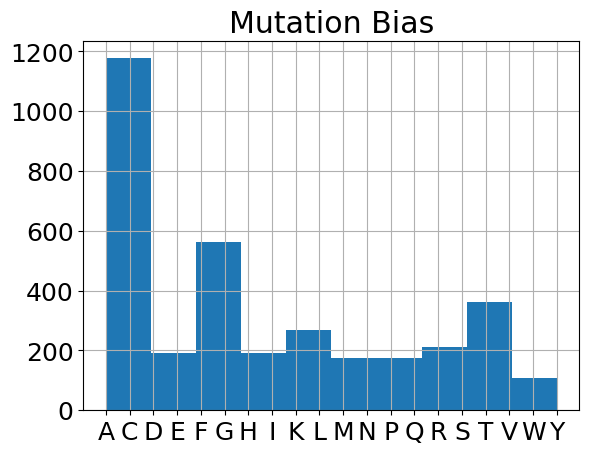

In [2]:
db.sort_values('mutation')['mutation'].hist()
plt.title('Mutation Bias')

### Preprocess and categorize data

Original unique mutations: 3421
['esmif_monomer_dir', 'msa_1_dir', 'msa_2_dir', 'msa_3_dir', 'msa_4_dir', 'msa_5_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'mutcomputex_dir', 'stability-oracle_dir', 'esm2_3B_dir', 'esm2_15B_half_dir', 'esmif_multimer_dir', 'mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'mif_dir', 'mifst_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'esm1v_1_dir', 'esm1v_2_dir', 'esm1v_3_dir', 'esm1v_4_dir', 'esm1v_5_dir', 'esm1v_median_dir', 'esm1v_mean_dir', 'ankh_dir', 'tranception_dir', 'korpm_dir', 'tranception_weights_dir', 'cartesian_ddg_dir']
['K1566_pslm_rfa_1_dir', 'K1566_pslm_rfa_2_dir', 'K1566_pslm_rfa_3_dir', 'K1566_pslm_rfa_4_dir', 'K1566_pslm_rfa_5_dir', 'K1566_pslm_rfa_6_dir', 'K1566_pslm_rfa_7_dir', 'K1566_pslm_rfa_8_dir', 'K1566_pslm_rfa_9_dir', 'K1566_pslm_rfa_10_dir', 'K1566_pslm_rfa_11_dir']
['esmif_monomer_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'mutcomputex_dir', 'stability-oracle_dir', 'esm2_3B_dir', 

,,esmif_monomer_dir,msa_1_dir,msa_2_dir,msa_3_dir,msa_4_dir,msa_5_dir,msa_transformer_median_dir,msa_transformer_mean_dir,mutcomputex_dir,stability-oracle_dir,...,K1566_pslm_rfa_8_dir,K1566_pslm_rfa_9_dir,K1566_pslm_rfa_10_dir,K1566_pslm_rfa_11_dir,ddG,cluster,mpnn_rosetta_dir,random_dir,ddG_dir,upper_bound_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
1A23_30S,1A23_30S,-0.043712,-9.003407,-8.570910,-8.138058,-7.828304,-8.771099,-8.570910,-8.462356,-0.010359,-0.420,...,-0.635816,-0.635816,-0.635816,-0.593140,-1.80,1,0.509908,-1.320435,-1.80,-0.907414
1A23_32L,1A23_32L,-0.042389,-8.228857,-7.639166,-7.996706,-7.244612,-7.631312,-7.639166,-7.748131,0.383801,0.528,...,0.434181,0.434181,0.434181,0.473899,4.95,1,4.100409,-3.516200,4.95,5.723558
1A23_32S,1A23_32S,-0.029983,-6.820486,-5.639109,-4.841201,-4.271751,-5.161361,-5.161361,-5.346782,-0.003409,-0.170,...,-0.368064,-0.368064,-0.368064,-0.353730,4.40,1,-1.339595,-0.861537,4.40,4.682289
1A23_32Y,1A23_32Y,-0.020219,-4.798388,-4.519424,-3.944585,-4.510036,-3.452652,-4.510036,-4.245017,0.060203,0.732,...,0.623211,0.623211,0.623211,0.661942,4.63,1,1.416091,0.034863,4.63,3.653402
1A23_33S,1A23_33S,-0.024960,-8.154238,-6.983203,-7.309464,-6.575727,-7.499977,-7.309464,-7.304522,-0.327936,-1.156,...,-0.846686,-0.846686,-0.846686,-0.815217,-1.10,1,0.489207,0.807938,-1.10,-1.314768
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5CRO_26L,5CRO_26L,-0.037373,-3.120034,-0.158593,-0.096729,-0.498763,-0.298061,-0.298061,-0.834436,0.002285,0.628,...,0.671593,0.671593,0.671593,0.670624,1.10,13,2.534977,-1.115265,1.10,1.201826
5CRO_26Q,5CRO_26Q,-0.004605,-2.316929,1.459888,1.633560,1.360325,1.471579,1.459888,0.721684,0.013478,0.921,...,0.267579,0.267579,0.267579,0.261379,1.40,13,2.969375,-1.134890,1.40,0.134859
5CRO_26V,5CRO_26V,0.037691,-2.944973,1.036326,0.091582,0.751292,0.919195,0.751292,-0.029315,0.043387,0.513,...,0.800252,0.800252,0.800252,0.774120,0.90,13,2.064658,-2.380439,0.90,0.720179


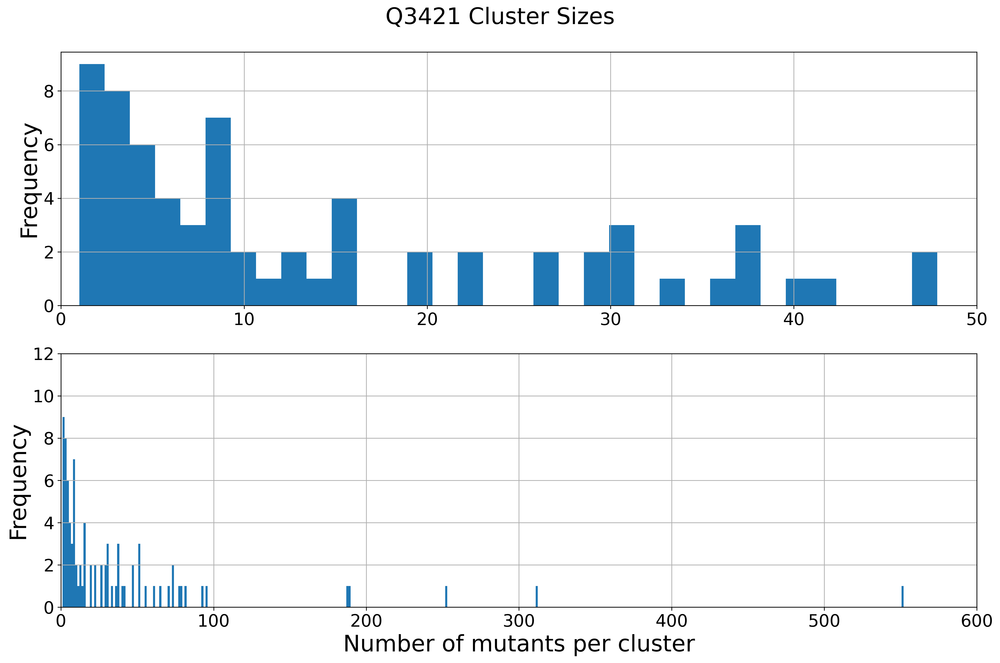

In [3]:
db_class = db

print('Original unique mutations:', len(db_class))

evolutionary = ['tranception', 'msa_transformer', 'esm1v', 'msa', 'esm2', 'ankh']
structural = ['mpnn', 'mif', 'mifst', 'esmif', 'mutcomputex']
supervised = ['MAESTRO', 'ThermoNet', 'INPS', 'PremPS', 'mCSM', 'DUET', 'ACDC', 'I-Mutant3.0', 'SAAFEC', 'MuPro']
untrained = ['DDGun']
potential = ['KORPM', 'PopMusic', 'SDM', 'korpm']
biophysical = ['cartesian_ddg', 'FoldX', 'Evo', 'Cartddg']
transfer = ['stability-oracle']

original_pred_cols = db_class.columns[db_class.columns.str.contains('|'.join(evolutionary + structural + supervised + untrained + potential + biophysical + transfer))]
original_pred_cols = list(original_pred_cols.drop(['reduced_msa_file', 'full_msa_file', 'tranception_dms', 'msa_weights']))#, 'msa_weights']))
original_pred_cols = [c for c in original_pred_cols if not 'runtime' in c]
original_pred_cols = [c for c in original_pred_cols if not 'cluster' in c]
original_pred_cols = [c for c in original_pred_cols if not 'overlaps' in c]
original_pred_cols = [c for c in original_pred_cols if not 'pll' in c]
print(original_pred_cols)

ensemble_cols = [c for c in db_class.columns if 'pslm' in c]
print(ensemble_cols)

db_runtimes = db[[c for c in db.columns if 'runtime' in c]]

original_pred_cols_reduced = deepcopy(original_pred_cols)
for col in [f'esm1v_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)
for col in [f'msa_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)

print(original_pred_cols_reduced)

db_class = db_class[original_pred_cols + ensemble_cols + ['ddG', 'cluster']]

#db_class_rescaled = db_class.copy(deep=True)
#db_class_rescaled[original_pred_cols] /= db_class_rescaled[original_pred_cols].std()

db_class['mpnn_rosetta_dir'] = db_class['cartesian_ddg_dir'] + db_class['mpnn_20_00_dir']
db_class['random_dir'] = np.random.normal(loc=db['ddG'].mean(), size=len(db_class))
#db_class['korpm_dir'] = db_class['KORPMD_dir']
db_class['ddG_dir'] = db_class['ddG']
db_class['upper_bound_dir'] = db_class['ddG'] + np.random.normal(loc=0, size=len(db_class))

#db_class = db_class.drop([c+'_dir' for c in ['ACDCNND', 'FoldXD', 'DDGunD', 'CartddgD']], axis=1) #'PopMsD', 'TNetD'

print(f'Detected {len(db_class.loc[db["on_interface_dir"].astype(bool)])} interface mutations')

fig, axes = plt.subplots(2, figsize=(15, 10), dpi=300) 

db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[0])
axes[0].set_xlim([0, 50]) 
axes[0].tick_params(axis='x', labelsize=18) 
axes[0].set_ylabel('Frequency', fontsize=24)  

# Second plot
db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[1])
axes[1].set_xlim([0, 600]) 
axes[1].set_ylim([0, 12])  
axes[1].set_xlabel('Number of mutants per cluster', fontsize=24) 
axes[1].set_ylabel('Frequency', fontsize=24)
axes[1].tick_params(axis='x', labelsize=18)

plt.suptitle('Q3421 Cluster Sizes', fontsize=24)
plt.tight_layout()

db_class

db_class

In [4]:
# Clusters with >= or < 50 unique mutants
print((db_class.groupby('cluster').count().iloc[:, 0] >= 50).sum(), (db_class.groupby('cluster').count().iloc[:, 0] < 50).sum())

19 67


### Non-bootstrapped Analysis of Q3421 (not in text; has the benefit of including all data at once)

In [5]:
# TABLE 1
# Note: due to changes in the dependencies and small changes to preprocessing,
# results have changed very slightly from the current revision, but do not affect
# the interpretation of results or conclusions

# could replace stats=() with ('n', 'MCC', 'auprc', 'ndcg', 'spearman')
# but then you would not be saving the other stats. 
# uncomment to_csv lines to save to a custom location
#db_class['code'] = db_class.index.str[:4]
summ = analysis_utils.compute_stats(db_class[original_pred_cols_reduced + ensemble_cols + ['cluster', 'ddG', 'mpnn_rosetta_dir', 'upper_bound_dir']], 
                                    stats=('n', 'MCC', 'pred_positives', 'tp', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'tp', 'recall@k1.0', 'aumsc', 'auppc'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=0)
rcv = summ.copy(deep=True)
summ.to_csv('../data/extended/q3421_extended.csv')
tmp1 = summ #.loc[:,['n', 'MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp = tmp1.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp[['measurement', 'model_type', 'model', 'n', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ', 'mean_t1s', 'Net Stabilization', 'pred_positives', 
 'mean_stabilization', 'True Positives', 'Sensitivity', 'MRR', 'recall@k1.0']]#, 'Accuracy']]
tmp = tmp.loc[tmp['model'].isin(['Rosetta CartDDG', 'ProteinMPNN mean', 'ProteinMPNN 0.3', 'ProteinMPNN 0.2', 'ESM-IF', 'MIF', 'ESM-IF(M)', 'Ankh', 
    'ESM-2 3B', 'ESM-2 15B', 'Structural', 'Evolutionary', 'Supervised', 'ESM-2 150M', 'ESM-2 650M', 'Ensemble', 'ESM-2 mean', 'ESM-IF mean', 
    'MIF_mean', 'Clustered Ensemble', 'Ensemble_2', 'ProteinMPNN 0.1', 'MIF-ST', 'KORPM', 'MSA-T mean', 'MSA-T 1', 'Tranception', 'Tranception reweighted', 'ESM-1V mean', 
    'ESM-1V 2', 'Gaussian noise', 'ΔΔG label', 'ΔTm label', 'Rosetta/ProtMPNN', 'Stability Oracle', 'MutComputeX',
    'Ensemble 5 Feats', 'Ensemble 6 Feats', 'Ensemble 7 Feats', 'ΔΔG label', 'Theoretical Max'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
tmp

# < 4 minutes

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

n    MCC  AUPRC      ρ  wNDCG  \
measurement model_type  model                                                  
ΔΔG         unknown     Theoretical Max   3421.0  0.538  0.718  0.829  0.842   
            ensemble    Ensemble 7 Feats  3421.0  0.306  0.480  0.596  0.679   
                        Ensemble 6 Feats  3421.0  0.307  0.481  0.596  0.674   
            struc. PSLM Rosetta/ProtMPNN  3421.0  0.344  0.530  0.620  0.706   
            ensemble    Ensemble 5 Feats  3421.0  0.305  0.481  0.596  0.677   
            transfer    Stability Oracle  3401.0  0.350  0.491  0.583  0.714   
            biophysical Rosetta CartDDG   3421.0  0.330  0.473  0.563  0.673   
            struc. PSLM ESM-IF            3418.0  0.241  0.430  0.452  0.658   
                        MIF               3421.0  0.266  0.437  0.480  0.660   
                        ProteinMPNN 0.3   3421.0  0.286  0.454  0.479  0.686   
                        ProteinMPNN 0.2   3421.0  0.288  0.460  0.488  0.679   
                        ProteinMPNN 0.1   3421.0  0.298  0.461  0.480  0.687   
                        ESM-IF(M)         3421.0  0.228  0.414  0.426  0.645   
            potential   KORPM             3421.0  0.257  0.400  0.471  0.659   
            struc. PSLM MIF-ST            3421.0  0.216  0.381  0.402  0.619   
                        MutComputeX       3409.0  0.214  0.402  0.365  0.635   
            seq. PSLM   ESM-2 650M        3421.0  0.198  0.362  0.291  0.612   
                        Ankh              3421.0  0.171  0.344  0.317  0.610   
                        ESM-2 3B          3421.0  0.174  0.329  0.260  0.597   
                        ESM-2 15B         3421.0  0.166  0.328  0.257  0.600   
                        MSA-T mean        3421.0  0.159  0.340  0.282  0.592   
                        ESM-2 150M        3421.0  0.150  0.338  0.219  0.610   
                        ESM-1V mean       3421.0  0.150  0.336  0.218  0.591   
                        Tranception       3421.0  0.159  0.330  0.266  0.571   

                                          wAUPRC     wρ  mean_t1s  \
measurement model_type  model                                       
ΔΔG         unknown     Theoretical Max    0.717  0.756     1.628   
            ensemble    Ensemble 7 Feats   0.572  0.500     0.626   
                        Ensemble 6 Feats   0.572  0.496     0.494   
            struc. PSLM Rosetta/ProtMPNN   0.572  0.496     0.702   
            ensemble    Ensemble 5 Feats   0.575  0.495     0.524   
            transfer    Stability Oracle   0.552  0.479     0.497   
            biophysical Rosetta CartDDG    0.537  0.434     0.446   
            struc. PSLM ESM-IF             0.514  0.408     0.736   
                        MIF                0.526  0.406     0.547   
                        ProteinMPNN 0.3    0.527  0.403     0.585   
                        ProteinMPNN 0.2    0.541  0.400     0.425   
                        ProteinMPNN 0.1    0.545  0.394     0.493   
                        ESM-IF(M)          0.503  0.382     0.617   
            potential   KORPM              0.518  0.358     0.282   
            struc. PSLM MIF-ST             0.487  0.329     0.181   
                        MutComputeX        0.481  0.283     0.111   
            seq. PSLM   ESM-2 650M         0.461  0.281     0.082   
                        Ankh               0.481  0.267    -0.017   
                        ESM-2 3B           0.450  0.258    -0.051   
                        ESM-2 15B          0.450  0.243     0.021   
                        MSA-T mean         0.470  0.240    -0.068   
                        ESM-2 150M         0.450  0.231     0.092   
                        ESM-1V mean        0.449  0.229    -0.141   
                        Tranception        0.429  0.224    -0.102   

                                          Net Stabilization  pred_positives  \
measurement model_type  model                                                 
ΔΔG         u

### Simultaneously Generate Figure 1A and ED Table 1

In [6]:
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'recall@k0.0', 'recall@k1.0'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=100, quiet=True)
tmp1 = summ.reset_index()
tmp1.to_csv('../data/extended/q3421_extended_bootstrapped.csv')

s2 = tmp1.sort_values('auprc_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir', 
            'upper_bound_dir',
            'K1566_pslm_rfa_2_dir', 
            'K1566_pslm_rfa_3_dir', 
            'K1566_pslm_rfa_4_dir',
            'K1566_pslm_rfa_5_dir',
            'K1566_pslm_rfa_6_dir',
            'K1566_pslm_rfa_7_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)

# ~ 15 minutes for 100 bootstraps

In [7]:
import importlib
importlib.reload(analysis_utils)

<module 'analysis_utils' from '/home/sareeves/PSLMs/analysis_notebooks/analysis_utils.py'>

upper_bound
mpnn_rosetta
stability-oracle
cartesian_ddg
mpnn_20_00
korpm
esm2_650M
random


AUPRC Spearman's ρ Net Stabilization   MCC  \
Model Type  Model                                                              
unknown     ΔΔG label              1.00         1.00         810 ± 104  1.00   
            Theoretical Max        0.72         0.83         523 ± 111  0.54   
struc. PSLM Rosetta/ProtMPNN       0.54         0.62        161 ± 48.1  0.34   
transfer    Stability Oracle       0.50         0.58      -17.6 ± 82.7  0.35   
ensemble    Ensemble 4 Feats       0.49         0.57      -45.5 ± 81.3  0.31   
            Ensemble 5 Feats       0.49         0.59      -46.7 ± 85.0  0.30   
            Ensemble 6 Feats       0.49         0.59      -28.5 ± 85.5  0.31   
            Ensemble 7 Feats       0.49         0.59      -40.0 ± 84.6  0.31   
biophysical Rosetta CartDDG        0.48         0.56       34.2 ± 78.1  0.33   
struc. PSLM ProteinMPNN 0.1        0.47         0.48       57.0 ± 49.3  0.30   
            ProteinMPNN 0.2        0.47         0.49       46.9 ± 52.7  0.29   
            ProteinMPNN 0.3        0.46         0.48       20.2 ± 59.8  0.29   
            MIF                    0.44         0.48      -18.7 ± 64.0  0.27   
            ESM-IF                 0.44         0.45       39.2 ± 53.4  0.24   
ensemble    Ensemble 3 Feats       0.43         0.50       -186 ± 94.9  0.24   
struc. PSLM ESM-IF(M)              0.42         0.42      -14.5 ± 71.4  0.23   
ensemble    Ensemble 2 Feats       0.41         0.44       -154 ± 73.2  0.21   
struc. PSLM MutComputeX            0.41         0.37      -16.2 ± 47.2  0.21   
potential   KORPM                  0.41         0.47        -235 ± 143  0.26   
struc. PSLM MIF-ST                 0.39         0.40      -10.4 ± 51.5  0.22   
seq. PSLM   ESM-2 650M             0.37         0.29      -56.4 ± 55.1  0.20   
            Ankh                   0.35         0.32      -5.55 ± 41.8  0.17   
            MSA-T mean             0.35         0.28      -36.0 ± 45.6  0.16   
            MSA-T median           0.34         0.28      -17.1 ± 44.9  0.16   
            ESM-2 150M             0.34         0.21        -364 ± 150  0.15   
            ESM-1V mean            0.34         0.21       -196 ± 98.5  0.14   
            Tranception            0.34         0.27       38.3 ± 20.4  0.16   
            ESM-1V median          0.33         0.21        -216 ± 104  0.14   
            ESM-2 15B              0.33         0.26       4.50 ± 34.0  0.17   
            ESM-2 3B               0.33         0.26      -21.8 ± 40.8  0.17   
            Tranception (reduced)  0.33         0.26       15.8 ± 18.1  0.14   
unknown     Gaussian Noise         0.23        -0.01        -492 ± 163  0.03   
NaN         Avg. Dev.              0.04         0.04             72.0   0.03   

                                  Sensitivity Recall @ k1   MRR  
Model Type  Model                                                
unknown     ΔΔG label                    1.00        1.00  1.00  
            Theoretical Max              0.76        0.54  0.68  
struc. PSLM Rosetta/ProtMPNN             0.35        0.32  0.45  
transfer    Stability Oracle             0.50        0.31  0.46  
ensemble    Ensemble 4 Feats             0.52        0.25  0.43  
            Ensemble 5 Feats             0.49        0.22  0.44  
            Ensemble 6 Feats             0.49        0.22  0.43  
            Ensemble 7 Feats             0.50        0.22  0.44  
biophysical Rosetta CartDDG              0.45        0.30  0.42  
struc. PSLM ProteinMPNN 0.1              0.32        0.24  0.47  
            ProteinMPNN 0.2              0.34        0.25  0.46  
            ProteinMPNN 0.3              0.35        0.25  0.46  
            MIF                          0.35        0.23  0.45  
            ESM-IF                       0.26        0.21  0.42  
ensemble    Ensemble 3 Feats             0.45        0.25  0.39  
struc. PSLM ESM-IF(M)                    0.26        0.21  0.42  
ensemble    Ensemble 2 Feats             0.37

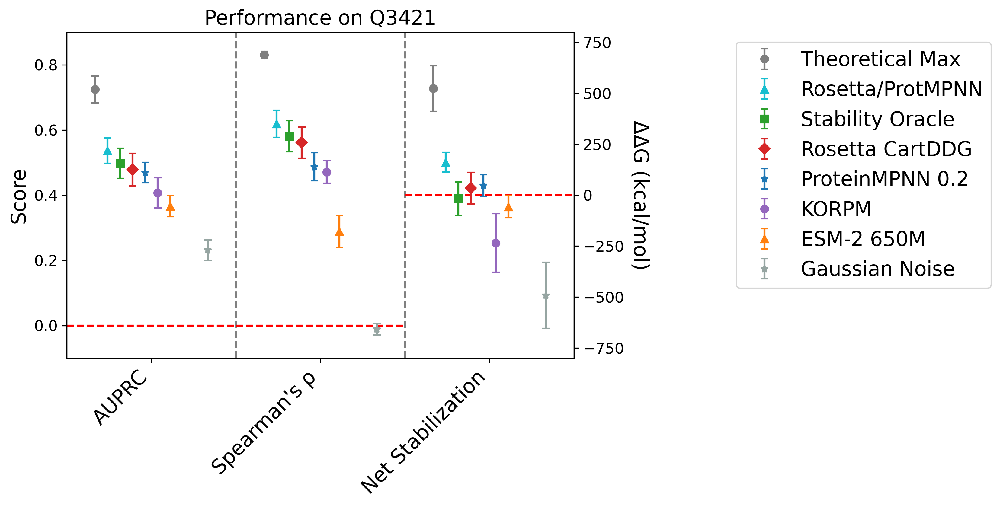

In [8]:
plot_cols = ['auprc', 'spearman','net_stabilization']
plot_models = ['upper_bound', 'mpnn_rosetta', 'stability-oracle', 'cartesian_ddg', 'mpnn_20_00', 'korpm', 'esm2_650M', 'DDGun3D', 'INPS3D', 'random']
plot_title = 'Q3421'
y_lim = (-0.1, 0.9)
right_y_lim = (-800, 800)
table_cols = ['auprc', 'spearman','net_stabilization', 'MCC', 'sensitivity', 'recall@k1.0', 'mean_reciprocal_rank']
saveloc = '../data/extended/q3421_bootstrapped_formatted.csv'
analysis_utils.bootstrap_table(s3, 
                plot_cols,
                plot_models, 
                plot_title,
                y_lim,
                right_y_lim,
                table_cols, 
                var_cols=['net_stabilization'], #table_cols, 
                sort_col='auprc',
                saveloc=saveloc)

### Recovery Curves (Visualization of Stable Mutant Enrichment, Figure 2. Only "b)" is used in main text)

In [9]:
db_class_r = db_class.copy(deep=True)
db_class_r['random_2_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_3_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_4_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_5_dir'] = np.random.normal(loc=0, size=len(db_class_r))

db_class_r['upper_bound_2_dir'] = db_class_r['ddG'] + np.random.normal(loc=0, size=len(db_class_r))
db_class_r['upper_bound_3_dir'] = db_class_r['ddG'] + np.random.normal(loc=0, size=len(db_class_r))
db_class_r['upper_bound_4_dir'] = db_class_r['ddG'] + np.random.normal(loc=0, size=len(db_class_r))
db_class_r['upper_bound_5_dir'] = db_class_r['ddG'] + np.random.normal(loc=0, size=len(db_class_r))

class_result_new = analysis_utils.compute_stats(db_class_r, stats=('aumsc', 'auppc'), measurements=['ddG'], grouper='cluster', n_bootstraps=0)
crn = class_result_new.reset_index()
crn.loc[crn['model'].str.contains('random'), 'model'] = 'random_dir'
crn.loc[crn['model'].str.contains('upper_bound'), 'model'] = 'upper_bound_dir'
crn = crn.set_index(['measurement', 'model_type', 'model'])
crn

# < 4 minutes

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

class  runtime        1%  \
measurement model_type  model                                                 
ddG         biophysical cartesian_ddg_dir                     NaN  0.305263   
            ensemble    K1566_pslm_rfa_10_dir                 NaN  0.284211   
                        K1566_pslm_rfa_11_dir                 NaN  0.294737   
                        K1566_pslm_rfa_1_dir                  NaN  0.221053   
                        K1566_pslm_rfa_2_dir                  NaN  0.242105   
                        K1566_pslm_rfa_3_dir                  NaN  0.252632   
                        K1566_pslm_rfa_4_dir                  NaN  0.273684   
                        K1566_pslm_rfa_5_dir                  NaN  0.273684   
                        K1566_pslm_rfa_6_dir                  NaN  0.263158   
                        K1566_pslm_rfa_7_dir                  NaN  0.284211   
                        K1566_pslm_rfa_8_dir                  NaN  0.284211   
                        K1566_pslm_rfa_9_dir                  NaN  0.284211   
            potential   korpm_dir                             NaN  0.252632   
            seq. PSLM   ankh_dir                              NaN  0.189474   
                        esm1v_1_dir                           NaN  0.168421   
                        esm1v_2_dir                           NaN  0.168421   
                        esm1v_3_dir                           NaN  0.189474   
                        esm1v_4_dir                           NaN  0.168421   
                        esm1v_5_dir                           NaN  0.178947   
                        esm1v_mean_dir                        NaN  0.189474   
                        esm1v_median_dir                      NaN  0.189474   
                        esm2_150M_dir                         NaN  0.221053   
                        esm2_15B_half_dir                     NaN  0.210526   
                        esm2_3B_dir                           NaN  0.178947   
                        esm2_650M_dir                         NaN  0.189474   
                        msa_1_dir                             NaN  0.200000   
                        msa_2_dir                             NaN  0.183908   
                        msa_3_dir                             NaN  0.183908   
                        msa_4_dir                             NaN  0.183908   
                        msa_5_dir                             NaN  0.206897   
                        msa_transformer_mean_dir              NaN  0.200000   
                        msa_transformer_median_dir            NaN  0.189474   
                        tranception_dir                       NaN  0.147368   
                        tranception_weights_dir               NaN  0.126316   
            struc. PSLM esmif_monomer_dir                     NaN  0.273684   
                        esmif_multimer_dir                    NaN  0.297872   
                        mif_dir                               NaN  0.294737   
                        mifst_dir                             NaN  0.221053   
                        mpnn_10_00_dir                        NaN  0.305263   
                        mpnn_20_00_dir                        NaN  0.263158   
                        mpnn_30_00_dir                        NaN  0.315789   
                        mpnn_rosetta_dir                      NaN  0.305263   
                        mutcomputex_dir                       NaN  0.210526   
            transfer    stability-oracle_dir                  NaN  0.247312   
            unknown     ddG_dir                               NaN  0.642105   
                        random_dir                            NaN  0.189474   
                        random_dir                            NaN  0.115789   
                        random_dir                            NaN  0.084211   
                        random_dir                            NaN  0.136842   
                      

cartesian_ddg_dir
korpm_dir
esm2_650M_dir
mpnn_20_00_dir
mpnn_rosetta_dir
stability-oracle_dir
random_dir
upper_bound_dir


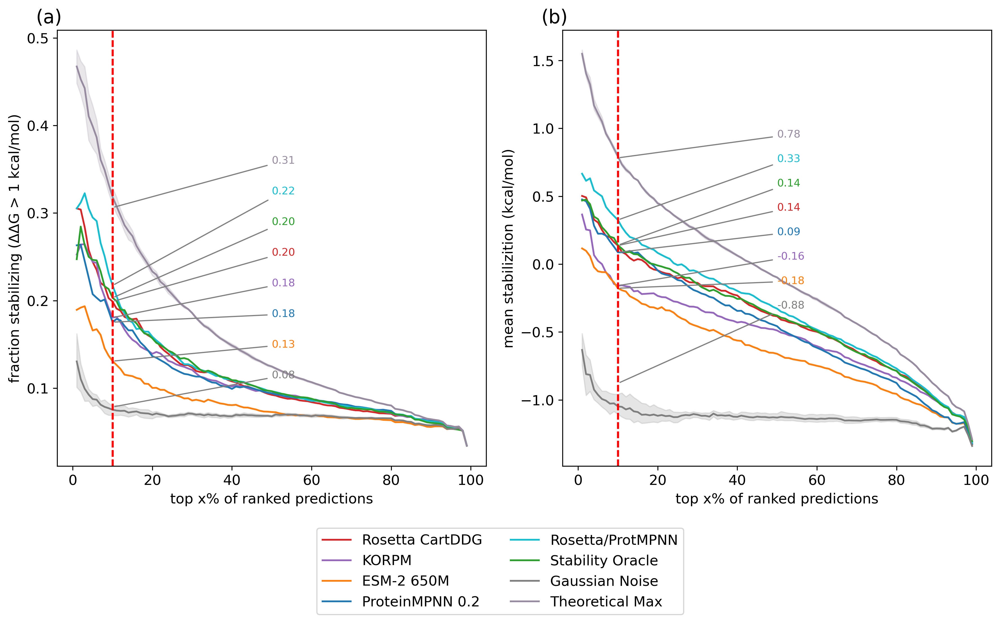

In [10]:
analysis_utils.recovery_curves(crn, ['upper_bound_dir', 'mpnn_20_00_dir', 'cartesian_ddg_dir', 'mpnn_rosetta_dir', 'korpm_dir', 'esm2_650M_dir', 'stability-oracle_dir', 'random_dir'], left_spacing=0.07, left_text_offset=(40, 0.05), right_spacing=0.06, right_text_offset=(40, 0.15), measurements=['ddG'], plots=['auppc', 'aumsc']) #'q3421_pslm_rfa_5_dir', 


### Recovery Curves (Visualization of Stable Mutant Enrichment, Supplementary Figure 6)

ankh_dir
esm2_650M_dir
msa_transformer_mean_dir
tranception_weights_dir
esmif_multimer_dir
mif_dir
mpnn_20_00_dir
mutcomputex_dir
random_dir
upper_bound_dir


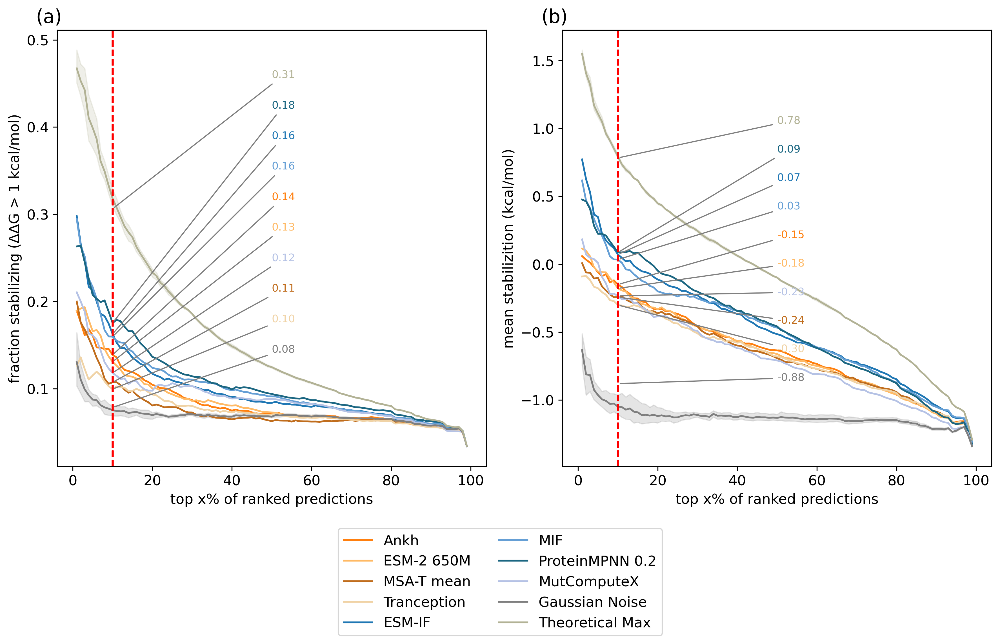

In [11]:
analysis_utils.recovery_curves(crn, ['upper_bound_dir', 'mpnn_20_00_dir', 'mif_dir', 'esmif_multimer_dir', 'ankh_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'tranception_weights_dir', 'mutcomputex_dir', 'random_dir'], left_spacing=0.07, left_text_offset=(40, 0.15), right_spacing=0.07, right_text_offset=(40, 0.25), measurements=['ddG'], plots=['auppc', 'aumsc'])

### Bootstrapped Q3421 Analysis (Used for Figure 1 and Extended Data Table 1)

### Supplementary Table 5

In [12]:
summ2 = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'ndcg', 'accuracy', 'mse', 'net_stabilization', 'mean_stabilization', 'precision', 'recall'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=100, quiet=True)
tmp2 = summ2.reset_index()

# < 15 minutes for 100 bootstraps

stability-oracle
korpm
random
mpnn_20_00
cartesian_ddg
esm2_650M
mpnn_rosetta


MSE Accuracy Spearman's ρ     wρ  \
Model Type  Model                                                             
unknown     ΔΔG label              0.00 ± 0.00     1.00         1.00   1.00   
            Theoretical Max        0.99 ± 0.02     0.82         0.83   0.75   
transfer    Stability Oracle       2.90 ± 0.47     0.77         0.58   0.47   
ensemble    Ensemble 5 Feats       2.99 ± 0.42     0.75         0.59   0.49   
            Ensemble 6 Feats       2.99 ± 0.42     0.75         0.59   0.49   
            Ensemble 7 Feats       3.00 ± 0.42     0.75         0.59   0.49   
            Ensemble 4 Feats       3.09 ± 0.42     0.74         0.57   0.47   
            Ensemble 3 Feats       3.31 ± 0.45     0.72         0.50   0.40   
potential   KORPM                  3.46 ± 0.48     0.73         0.47   0.35   
ensemble    Ensemble 2 Feats       3.55 ± 0.45     0.73         0.44   0.34   
struc. PSLM MutComputeX            3.90 ± 0.42     0.77         0.36   0.29   
            ESM-IF                 4.88 ± 0.47     0.77         0.45   0.41   
            ESM-IF(M)              4.88 ± 0.47     0.77         0.42   0.38   
unknown     Gaussian Noise         4.92 ± 0.40     0.71        -0.01  -0.00   
seq. PSLM   Tranception (reduced)  4.93 ± 0.47     0.77         0.26   0.20   
            Tranception            4.93 ± 0.47     0.77         0.26   0.22   
struc. PSLM ProteinMPNN 0.3        7.13 ± 0.77     0.77         0.47   0.41   
            ProteinMPNN 0.2        7.45 ± 0.74     0.78         0.48   0.40   
            ProteinMPNN 0.1        8.23 ± 0.79     0.78         0.47   0.39   
seq. PSLM   ESM-2 150M             15.9 ± 2.00     0.71         0.21   0.23   
struc. PSLM MIF                    23.3 ± 1.79     0.76         0.47   0.40   
seq. PSLM   ESM-1V mean            24.2 ± 3.62     0.74         0.22   0.22   
            ESM-1V median          24.3 ± 3.63     0.74         0.21   0.21   
biophysical Rosetta CartDDG        25.9 ± 2.05     0.77         0.56   0.43   
seq. PSLM   ESM-2 650M             27.3 ± 3.00     0.76         0.29   0.28   
struc. PSLM MIF-ST                 34.3 ± 2.76     0.77         0.40   0.32   
seq. PSLM   Ankh                   37.5 ± 3.32     0.77         0.31   0.26   
            MSA-T mean             37.9 ± 3.23     0.76         0.28   0.23   
            MSA-T median           38.5 ± 3.27     0.76         0.27   0.23   
            ESM-2 3B               42.1 ± 5.76     0.76         0.26   0.25   
            ESM-2 15B              51.8 ± 6.31     0.77         0.25   0.23   
struc. PSLM Rosetta/ProtMPNN       57.4 ± 4.25     0.80         0.61   0.49   
NaN         Avg. Dev.                    1.73      0.02         0.04   0.03   

                                   NDCG wNDCG  
Model Type  Model                              
unknown     ΔΔG label              1.00  1.00  
            Theoretical Max        0.95  0.85  
transfer    Stability Oracle       0.62  0.72  
ensemble    Ensemble 5 Feats       0.62  0.69  
            Ensemble 6 Feats       0.62  0.68  
            Ensemble 7 Feats       0.62  0.69  
            Ensemble 4 Feats       0.63  0.69  
            Ensemble 3 Feats       0.61  0.66  
potential   KORPM                  0.61  0.66  
ensemble    Ensemble 2 Feats       0.60  0.64  
struc. PSLM MutComputeX            0.57  0.64  
            ESM-IF                 0.62  0.67  
            ESM-IF(M)              0.62  0.66  
unknown     Gaussian Noise         0.51  0.55  
seq. PSLM   Tranception (reduced)  0.54  0.58  
            Tranception            0.55  0.58  
struc. PSLM ProteinMPNN 0.3        0.62  0.69  
            ProteinMPNN 0.2        0.61  0.69  
            ProteinMPNN 0.1        0.62  0.70  
seq. PSLM   ESM-2 150M             0.58  0.62  
struc. PSLM MIF                    0.61  0.67  
seq. PSLM   ESM-1V mean            0.57  0.60  
            ESM-1V median          0.57  0.60  
biophysical Rosetta CartDDG        0.62  0.68  
seq. PSLM   ESM-2 650M       

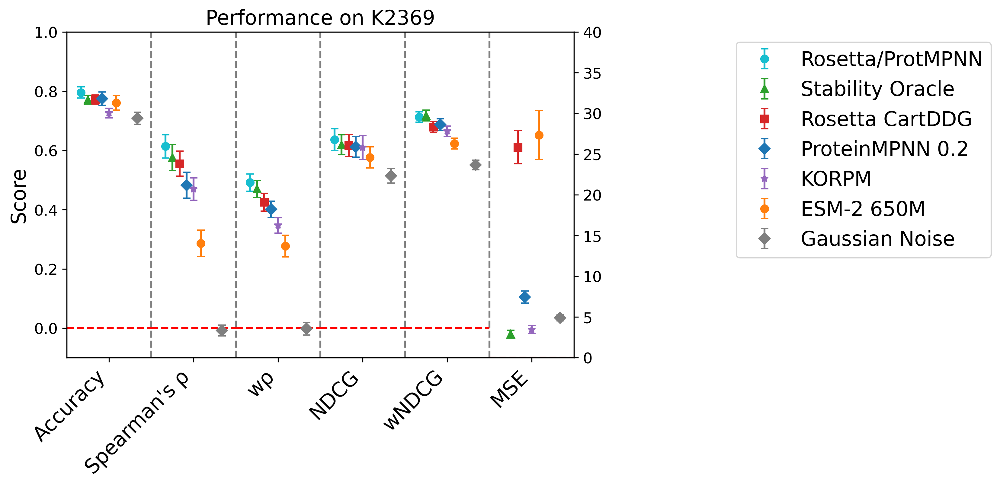

In [13]:
importlib.reload(analysis_utils)
ss2 = tmp2.sort_values('mean_squared_error_mean', ascending=False).dropna(how='all', axis=1).reset_index()
ss3 = ss2.loc[ss2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir',
            'upper_bound_dir', 
            'K1566_pslm_rfa_2_dir', 
            'K1566_pslm_rfa_3_dir', 
            'K1566_pslm_rfa_4_dir',
            'K1566_pslm_rfa_5_dir',
            'K1566_pslm_rfa_6_dir',
            'K1566_pslm_rfa_7_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)
plot_cols = ['accuracy', 'spearman', 'weighted_spearman', 'ndcg', 'weighted_ndcg', 'mean_squared_error',]
plot_models = ['mpnn_rosetta', 'stability-oracle', 'cartesian_ddg', 'mpnn_20_00', 'korpm', 'esm2_650M', 'DDGun3D', 'INPS3D', 'random']
plot_title = 'K2369'
y_lim = (-0.1, 1)
right_y_lim = (0, 40)
table_cols = ['mean_squared_error', 'accuracy', 'spearman', 'weighted_spearman', 'ndcg', 'weighted_ndcg']
analysis_utils.bootstrap_table(ss3, 
                plot_cols,
                plot_models, 
                plot_title,
                y_lim,
                right_y_lim,
                table_cols, 
                var_cols=['mean_squared_error'],
                sort_col='mean_squared_error',
                sort_order='ascending',
                saveloc='../data/extended/q3421_bootstrapped_formatted_extra.csv'
                )

### Extended Data Figure 1 describing correlation between predictions and scores of two selected models

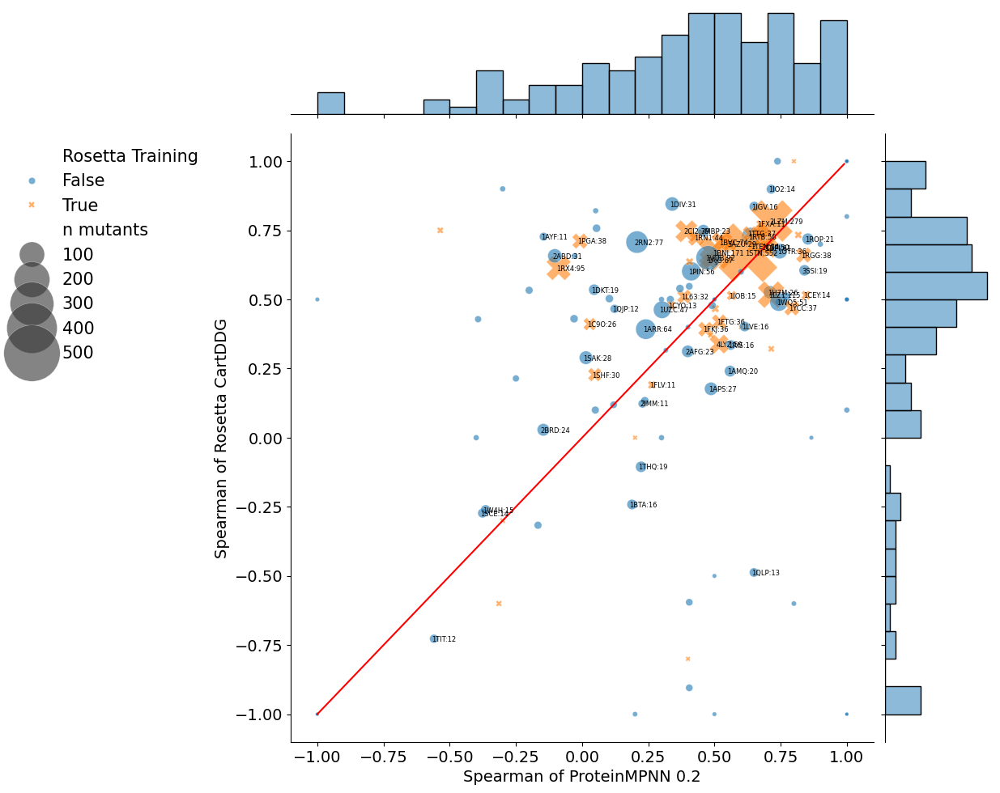

In [14]:
importlib.reload(analysis_utils)

col = 'Rosetta Training'
db_class_2 = db_class.copy(deep=True)
#db_class_2 = db_class_2.join(db_new[['tranception_new_dir']])
db_class_2['ddG_dir'] = db_class_2['ddG']
db_class_2[col] = db['overlaps_seq_rosetta']
db_class_2['code'] = db_class_2.reset_index('uid2').index.str[:4]
_ = analysis_utils.correlations(db_class_2, None, stat='spearman', marker_name=col,
    score_name='cartesian_ddg_dir', score_name_2='mpnn_20_00_dir', min_obs=10, group=True, plot=True, out=True, runtime=False)

### Figure 4 a&b

In [15]:
subset = ['K1566_pslm_rfa_6_dir',
            'upper_bound_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_weights_dir',
            'esm2_650M_dir',
            #'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            'mpnn_rosetta_dir',
            #'mpnn_10_00_dir',
            'mpnn_20_00_dir',
            #'mpnn_30_00_dir',
            #'mif_dir',
            'mifst_dir',
            'mutcomputex_dir',
            'stability-oracle_dir',
            'random_dir',
            'ddG_dir']
"""
db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]

current_feats = ['ΔΔG', 'ddG']
# fillna only applies to a handful of predictions from Stability Oracle
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']].fillna(0)
d, model_order = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'ΔΔG', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -1.5, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        count_muts = True,
                        subset = subset,
                        grouper = 'cluster',
                        plots = 'top',
                        drop_label = True,
                        )  

model_order
# < 10 seconds
"""

"\ndb_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')\ndb_complete['ddG_dir'] = db_complete['ddG']\ndb_complete['ΔΔG'] = db_complete['ddG']\n#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]\n\ncurrent_feats = ['ΔΔG', 'ddG']\n# fillna only applies to a handful of predictions from Stability Oracle\ndb_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']].fillna(0)\nd, model_order = analysis_utils.compare_performance(\n                        db_fig,\n                        split_col = 'ΔΔG', \n                        split_col_2 = None, \n                        threshold_1 = 0, \n                        threshold_2 = -1.5, \n                        measurement = 'ddG',\n                        statistic = 'spearman',\n                        statistic_2 = 'weighted_spearman',\n                        n_bootstraps= 1000,\n                        count_muts = True,\n          

  0%|          | 0/1000 [00:00<?, ?it/s]

['ΔΔG > 0', '0 >= ΔΔG > -1.5', 'ΔΔG <= -1.5']
class
0 >= ΔΔG > -1.5    919
ΔΔG <= -1.5        777
ΔΔG > 0            484
Name: n, dtype: int64


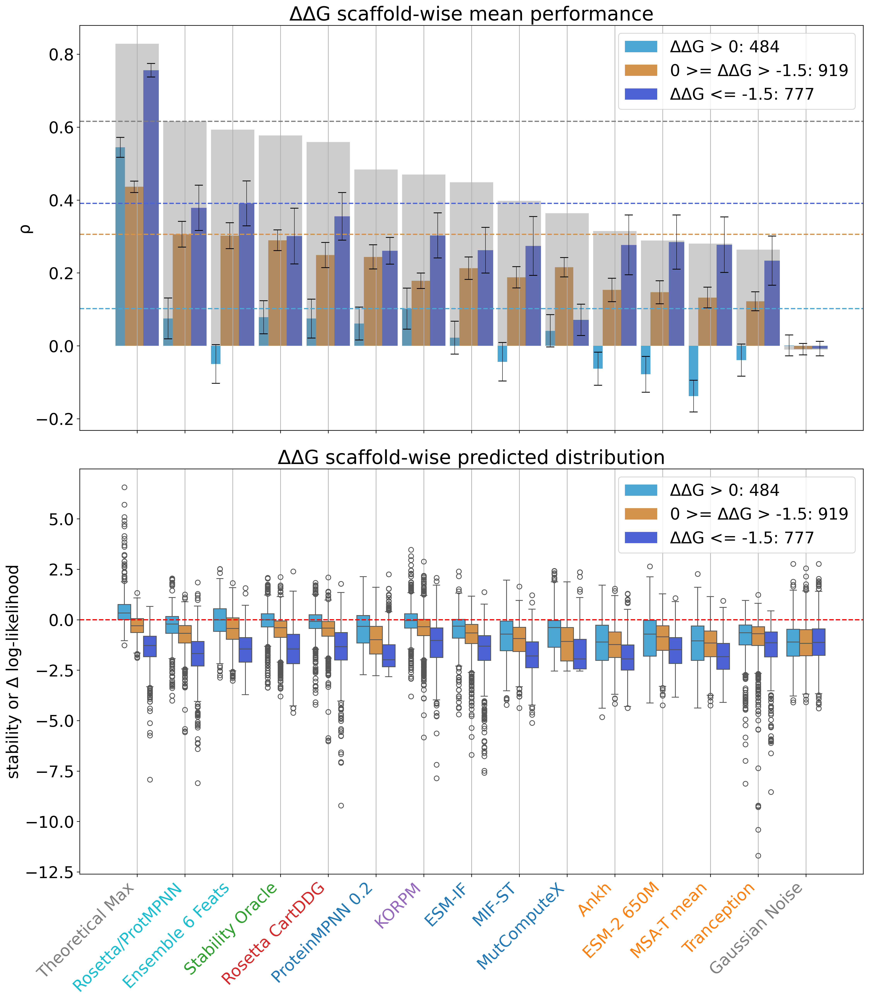

14             upper_bound_dir
10            mpnn_rosetta_dir
1         K1566_pslm_rfa_6_dir
12        stability-oracle_dir
0            cartesian_ddg_dir
9               mpnn_20_00_dir
2                    korpm_dir
7           esmif_multimer_dir
8                    mifst_dir
11             mutcomputex_dir
3                     ankh_dir
4                esm2_650M_dir
5     msa_transformer_mean_dir
6      tranception_weights_dir
13                  random_dir
Name: model, dtype: object

In [16]:
import importlib
importlib.reload(analysis_utils)

db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]

current_feats = ['ΔΔG', 'ddG']
# fillna only applies to a handful of predictions from Stability Oracle
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']].fillna(0)
d, model_order = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'ΔΔG', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -1.5, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        #count_muts = True,
                        subset = subset,
                        grouper = 'cluster',
                        plots = 'both',
                        drop_label = True,
                        legend_loc = 'upper right'
                        )  

model_order
# < 10 seconds

  0%|          | 0/1000 [00:00<?, ?it/s]

['ΔΔG > 0', '0 >= ΔΔG > -1.5', 'ΔΔG <= -1.5']
class
0 >= ΔΔG > -1.5    907
ΔΔG <= -1.5        767
ΔΔG > 0            482
Name: n, dtype: int64


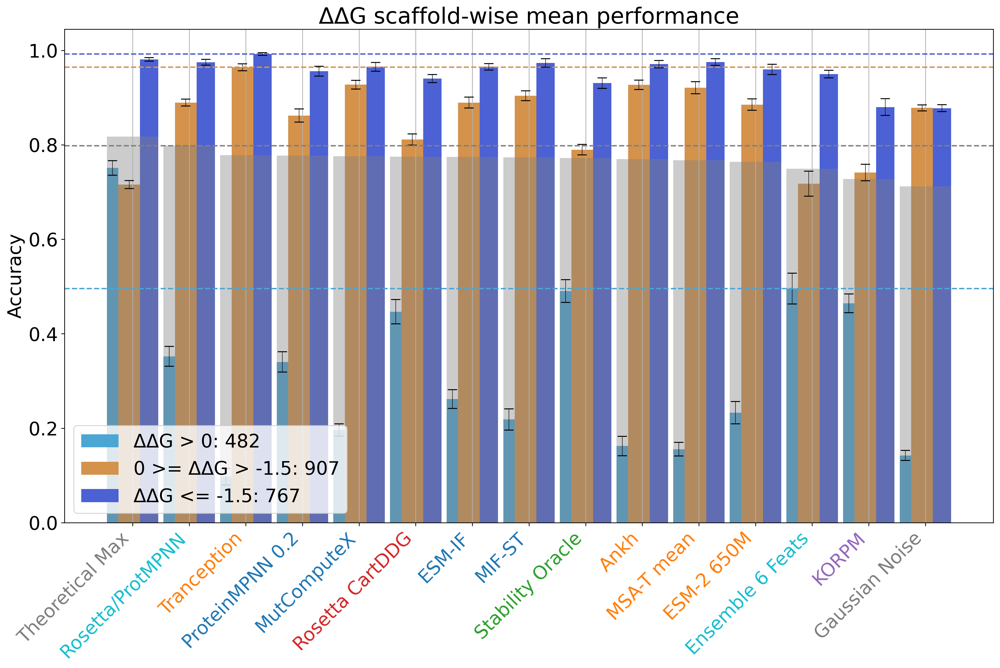

In [17]:
db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]

current_feats = ['ΔΔG', 'ddG']
# fillna only applies to a handful of predictions from Stability Oracle
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']].fillna(0)
d, _ = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'ΔΔG', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -1.5, 
                        measurement = 'ddG',
                        statistic = 'accuracy',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        #count_muts = True,
                        subset = subset,
                        grouper = 'cluster',
                        plots = 'top',
                        drop_label = True,
                        )  

#model_order
# < 10 seconds

(0.0, 50.0)

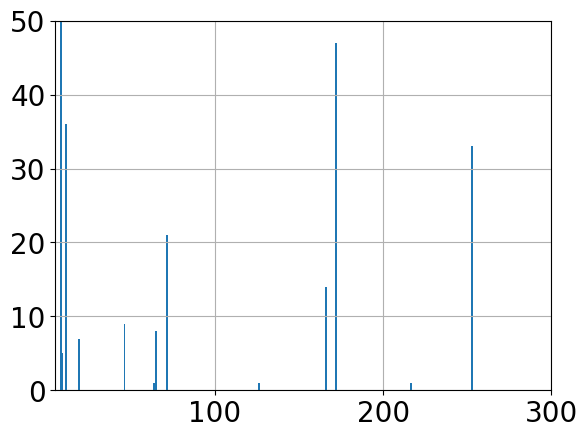

In [18]:
db_complete.loc[db_complete['neff'] < 1000, 'neff'].hist(bins=1000)
plt.xlim(5,300)
plt.ylim(0,50)

### Figure 4 c&d

  0%|          | 0/1000 [00:00<?, ?it/s]

['conservation > 70', 'neff > 300 & conservation <= 70', 'neff <= 300 & conservation <= 70']
conservation > 70% : 397
neff > 300 & conservation <= 70% : 1587
neff <= 300 & conservation <= 70% : 185
class
conservation > 70                    397
neff <= 300 & conservation <= 70     185
neff > 300 & conservation <= 70     1587
Name: n, dtype: int64


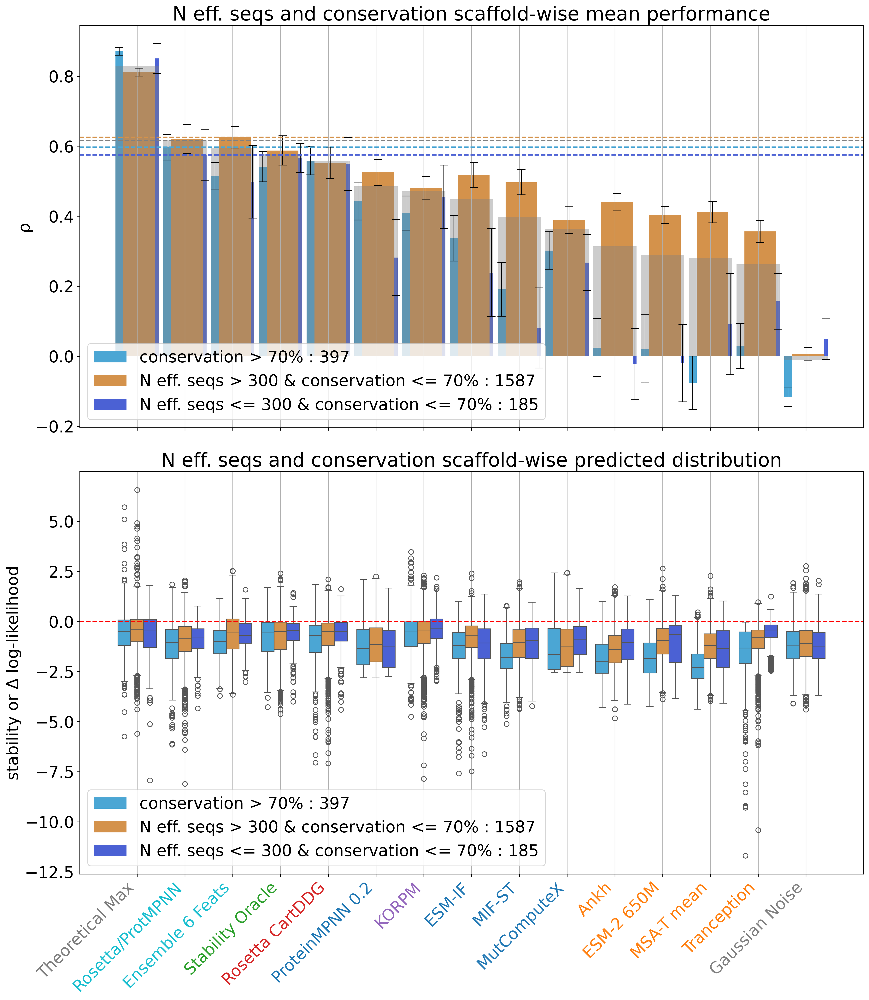

In [19]:
importlib.reload(analysis_utils)

db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
            
current_feats = ['conservation', 'neff', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d, models = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'neff', 
                        split_col_2 = 'conservation', 
                        threshold_1 = 300,
                        threshold_2 = 70, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        #count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        #order=model_order,
                        plots='both',
                        drop_label = True,
                        split_last = False
                        # scaffold order is col1 & col2 > T, col1 < T & col2 > T, col1 > T and col2 < T, col1 & col2 < T
                        )

  0%|          | 0/1000 [00:00<?, ?it/s]

538.5
545.5
['delta_kdh > 0 & rel_ASA > 0.2', 'delta_kdh <= 0 & rel_ASA > 0.2', 'delta_kdh > 0 & rel_ASA <= 0.2', 'delta_kdh <= 0 & rel_ASA <= 0.2']
class
delta_kdh <= 0 & rel_ASA <= 0.2    592
delta_kdh <= 0 & rel_ASA > 0.2     430
delta_kdh > 0 & rel_ASA <= 0.2     431
delta_kdh > 0 & rel_ASA > 0.2      701
Name: n, dtype: int64


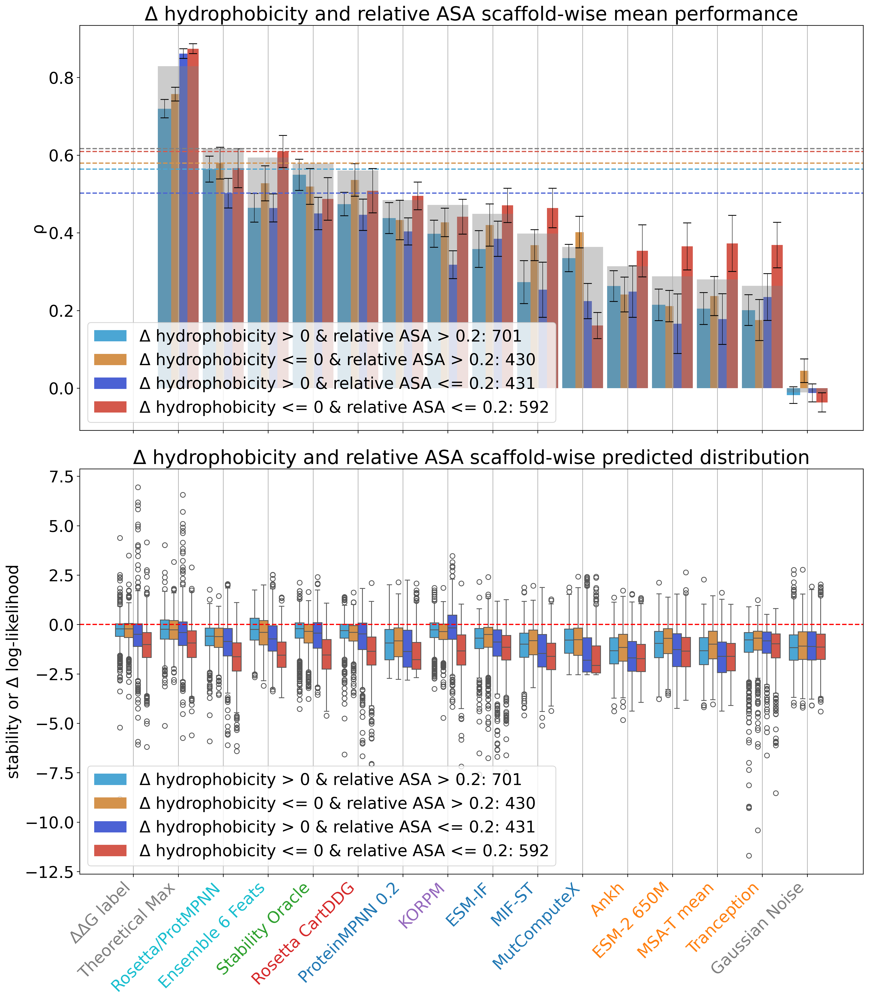

In [20]:
current_feats = ['delta_kdh_dir', 'rel_ASA_dir', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
l1 = len(db_fig)
db_fig = db_fig.fillna(0)
#db_fig = db_fig.drop(['delta_kdh_dir', 'rel_ASA_dir'], axis=1)
db_fig = db_fig.rename({'delta_kdh_dir': 'delta_kdh', 'rel_ASA_dir': 'rel_ASA'}, axis=1)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'delta_kdh', 
                        split_col_2 = 'rel_ASA', 
                        threshold_1 = 0, 
                        threshold_2 = 0.2, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        #order=model_order,
                        drop_label=False
                        )
# < 10 seconds

### Generating the pairwise ensembles used in the model complementarity section

In [21]:
zs_feats = ['rel_ASA', 'delta_kdh', 'delta_vol', 'delta_chg']
models = original_pred_cols_reduced + [c + '_dir' for c in zs_feats]
#models += ['mpnn_mean_dir', 'esmif_mean_dir', 'esm2_mean_dir', 'mif_mean_dir']

#db_summ = db_preds.join(db_ddg).join(db_cluster)
#db_summ = db_class
#db_summ['ddG_dir'] = db_summ['ddG']
#db_summ['random_dir'] = np.random.normal(loc=0, size=len(db_summ))

dfm = db[models + ['cluster', 'ddG']] #db_summ.join(db_feats_2[zs_feats].drop_duplicates(), how='left')
#dfm['code'] = dfm.reset_index('uid2').index.str[:4]
ren = dict(zip(zs_feats, [f+'_dir' for f in zs_feats]))
dfm = dfm.rename(ren, axis=1)
dfr = db_runtimes.copy(deep=True).reset_index(level=0, drop=True)#.drop('uid', axis=1)
dfr['code'] = dfr.index.str[:4]
dfr[['runtime_' + r for r in ['rel_ASA_dir', 'delta_kdh_dir', 'delta_vol_dir', 'delta_chg_dir']]] = 0
dfr['runtime_mutcomputex_dir'] = np.nan
dfr['runtime_stability-oracle_dir'] = np.nan

weights = [1, 0.5, 0.2] #, -0.2] # could include -0.2 to allow for subtracting models
weights2 = [] # fill in weights to test 3-model ensembles
#weights2 = [0.8, 0.3]

all_cols = []

tmp_preds = []
tmp_runtimes = []
for model1 in models:
    for model2 in models:
        if model1 != model2:
            for weight in weights:
                tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight, name=f'{model1} + {model2} * {weight}'))
                #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model1].max() * weight, name=f'{model1} + {model2} * {weight}'))
                all_cols.append(f'{model1} + {model2} * {weight}')
                tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2], name=f'runtime_'+all_cols[-1]))
                for model3 in models:
                    if model3 != model2:
                    #if (model1.split('_')[0] != model3.split('_')[0]) and (model2.split('_')[0] != model3.split('_')[0]):
                        for weight2 in weights2:
                            tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight + dfm[model3]/dfm[model3].std() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model2].max() * weight + (dfm[model3]-dfm[model3].min())/dfm[model3].max() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            all_cols.append(f'{model1} + {model2} * {weight} + {model3} * {weight2}')
                            #tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2] + dfr['runtime_'+model3], name='runtime_'+all_cols[-1]))

print('concatenating')
dfm = pd.concat([dfm] + tmp_preds, axis=1)
dfr = pd.concat([dfr] + tmp_runtimes, axis=1)
print('joining...')
dfm = dfm.join(dfr.drop('code', axis=1))
dfm

# < 10 seconds

concatenating
joining...


,,esmif_monomer_dir,msa_transformer_median_dir,msa_transformer_mean_dir,mutcomputex_dir,stability-oracle_dir,esm2_3B_dir,esm2_15B_half_dir,esmif_multimer_dir,mpnn_10_00_dir,mpnn_20_00_dir,...,runtime_delta_chg_dir + cartesian_ddg_dir * 0.2,runtime_delta_chg_dir + rel_ASA_dir * 1,runtime_delta_chg_dir + rel_ASA_dir * 0.5,runtime_delta_chg_dir + rel_ASA_dir * 0.2,runtime_delta_chg_dir + delta_kdh_dir * 1,runtime_delta_chg_dir + delta_kdh_dir * 0.5,runtime_delta_chg_dir + delta_kdh_dir * 0.2,runtime_delta_chg_dir + delta_vol_dir * 1,runtime_delta_chg_dir + delta_vol_dir * 0.5,runtime_delta_chg_dir + delta_vol_dir * 0.2
uid,uid2,,,,,,,,,,,,,,,,,,,,,
1A23_30S,1A23_30S,-0.043712,-8.570910,-8.462356,-0.010359,-0.420,-11.571676,-11.668701,-0.043713,1.969108,2.077375,...,5,0,0,0,0,0,0,0,0,0
1A23_32L,1A23_32L,-0.042389,-7.639166,-7.748131,0.383801,0.528,-13.755667,-13.076172,-0.042389,-0.021528,2.326742,...,6,0,0,0,0,0,0,0,0,0
1A23_32S,1A23_32S,-0.029983,-5.161361,-5.346782,-0.003409,-0.170,-8.291791,-10.436035,-0.029983,0.243430,0.858738,...,6,0,0,0,0,0,0,0,0,0
1A23_32Y,1A23_32Y,-0.020219,-4.510036,-4.245017,0.060203,0.732,-8.121881,-9.415039,-0.020220,-0.115764,0.649091,...,6,0,0,0,0,0,0,0,0,0
1A23_33S,1A23_33S,-0.024960,-7.309464,-7.304522,-0.327936,-1.156,-12.002896,-12.722168,-0.024960,1.373216,-0.305126,...,6,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5CRO_26L,5CRO_26L,-0.037373,-0.298061,-0.834436,0.002285,0.628,-3.150103,-2.374512,-0.038054,0.082326,0.305977,...,6,0,0,0,0,0,0,0,0,0
5CRO_26Q,5CRO_26Q,-0.004605,1.459888,0.721684,0.013478,0.921,-2.508844,-2.625244,-0.006247,1.808440,1.264375,...,6,0,0,0,0,0,0,0,0,0
5CRO_26V,5CRO_26V,0.037691,0.751292,-0.029315,0.043387,0.513,-3.204980,-2.228027,0.032355,1.397881,0.928658,...,6,0,0,0,0,0,0,0,0,0


In [22]:
series = dfm.reset_index()['uid'].duplicated(keep=False)
dfm.reset_index()['uid'][series]

Series([], Name: uid, dtype: object)

### Function to retrieve all the pairwise predictions (precalculated for this demo)

In [23]:
def get_summary_df(db_complete, cols=None, class_stats=(), saveloc='../data/pairwise/q3421_pairwise.csv', overwrite=False):

    if not overwrite:
        assert not os.path.exists(saveloc)
    if cols is None:
        cols = db_complete.columns

    df_summ = analysis_utils.compute_stats(db_complete[cols], stats=class_stats, measurements=['ddG'], grouper='cluster').reset_index().set_index(['measurement', 'model'])
    df_summ = df_summ.reset_index().rename({'index': 'model'}, axis=1)
    df_summ = df_summ.set_index(['measurement', 'model_type', 'model', 'class'])

    df_summ.to_csv(saveloc)
    return df_summ

### Pairwise statistics for all model combinations

In [24]:
# compute all statistics on the combined set (already done, takes ~12 hours)
#d1 = get_summary_df(dfm, saveloc=os.path.join(path, 'data', 'pairwise', 'pairwise_q3421_combinations_3_weights.csv'), overwrite=True)
d1 = pd.read_csv(os.path.join(path, 'data', 'pairwise', 'pairwise_q3421_combinations_3_weights.csv')).set_index(['measurement', 'model_type', 'model', 'class'])
d1.xs('ddG').sort_values('aumsc', ascending=False).iloc[:20, 13:]

auroc  \
model_type  model                                           class             
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.5        NaN    0.783691   
transfer    stability-oracle_dir + mpnn_10_00_dir * 0.5     NaN    0.792048   
            mpnn_20_00_dir + stability-oracle_dir * 1       NaN    0.785490   
            stability-oracle_dir + mpnn_20_00_dir * 1       NaN    0.785490   
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 1          NaN    0.777436   
            mpnn_20_00_dir + cartesian_ddg_dir * 1          NaN    0.777436   
            cartesian_ddg_dir + stability-oracle_dir * 1    NaN    0.796168   
            stability-oracle_dir + cartesian_ddg_dir * 1    NaN    0.796168   
            cartesian_ddg_dir + stability-oracle_dir * 0.5  NaN    0.791328   
transfer    stability-oracle_dir + mpnn_20_00_dir * 0.5     NaN    0.793441   
biophysical cartesian_ddg_dir + mpnn_30_00_dir * 0.5        NaN    0.779256   
transfer    mpnn_10_00_dir + stability-oracle_dir * 1       NaN    0.782551   
            stability-oracle_dir + mpnn_10_00_dir * 1       NaN    0.782551   
biophysical cartesian_ddg_dir + esmif_multimer_dir * 0.5    NaN    0.767683   
transfer    stability-oracle_dir + mpnn_30_00_dir * 0.5     NaN    0.790866   
            stability-oracle_dir + esmif_multimer_dir * 0.5 NaN    0.782840   
biophysical cartesian_ddg_dir + mpnn_10_00_dir * 1          NaN    0.776392   
            mpnn_10_00_dir + cartesian_ddg_dir * 1          NaN    0.776392   
transfer    esmif_multimer_dir + stability-oracle_dir * 1   NaN    0.772896   
            stability-oracle_dir + esmif_multimer_dir * 1   NaN    0.772896   

                                                                      auprc  \
model_type  model                                           class             
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.5        NaN    0.530218   
transfer    stability-oracle_dir + mpnn_10_00_dir * 0.5     NaN    0.524390   
            mpnn_20_00_dir + stability-oracle_dir * 1       NaN    0.519869   
            stability-oracle_dir + mpnn_20_00_dir * 1       NaN    0.519869   
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 1          NaN    0.525606   
            mpnn_20_00_dir + cartesian_ddg_dir * 1          NaN    0.525606   
            cartesian_ddg_dir + stability-oracle_dir * 1    NaN    0.529939   
            stability-oracle_dir + cartesian_ddg_dir * 1    NaN    0.529939   
            cartesian_ddg_dir + stability-oracle_dir * 0.5  NaN    0.522532   
transfer    stability-oracle_dir + mpnn_20_00_dir * 0.5     NaN    0.523954   
biophysical cartesian_ddg_dir + mpnn_30_00_dir * 0.5        NaN    0.523187   
transfer    mpnn_10_00_dir + stability-oracle_dir * 1       NaN    0.522305   
            stability-oracle_dir + mpnn_10_00_dir * 1       NaN    0.522305   
biophysical cartesian_ddg_dir + esmif_multimer_dir * 0.5    NaN    0.503517   
transfer    stability-oracle_dir + mpnn_30_00_dir * 0.5     NaN    0.521065   
            stability-oracle_dir + esmif_multimer_dir * 0.5 NaN    0.508719   
biophysical cartesian_ddg_dir + mpnn_10_00_dir * 1          NaN    0.525923   
            mpnn_10_00_dir + cartesian_ddg_dir * 1          NaN    0.525923   
transfer    esmif_multimer_dir + stability-oracle_dir * 1   NaN    0.503824   
            stability-oracle_dir + esmif_multimer_dir * 1   NaN    0.503824   

                                                                   0.0_n_stable  \
model_type  model                                           class                 
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.5        NaN           761.0   
transfer    stability-oracle_dir + mpnn_10_00_dir * 0.5     NaN           752.0   
            mpnn_20_00_dir + stability-oracle_dir * 1       NaN           752.0   
            stability-oracle_dir + mpnn_20_00_dir * 1       NaN           752.0   
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 1          NaN           761.0   
           

### Supplementary Figure 7

3421


  0%|          | 0/5 [00:00<?, ?it/s]

0.0966167548609802
['Stability Oracle', 'Rosetta CartDDG', 'ProteinMPNN 0.2', 'MIF', 'KORPM', 'ESM-IF', 'MIF-ST', 'MutComputeX', 'Ankh', 'MSA-T mean', 'Tranception (reduced)', 'ESM-1V mean']


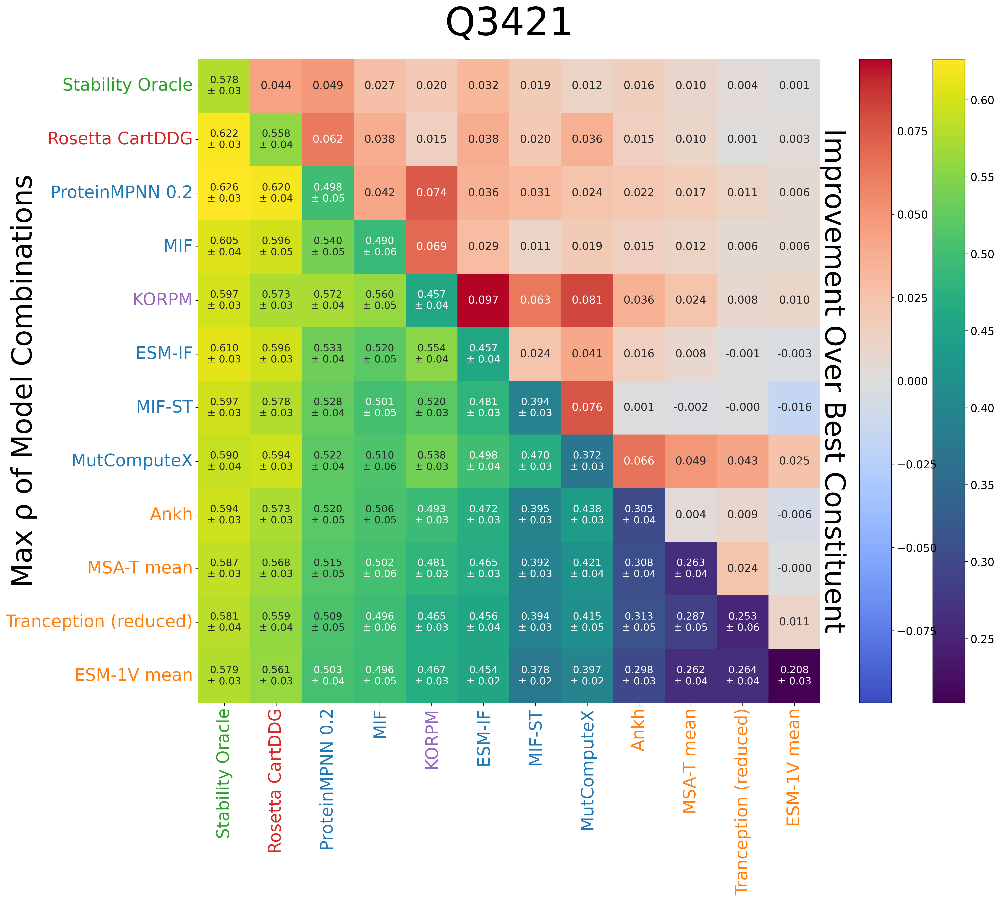

,model1,weight1,model2,weight2,mean_spearman,p_value
rank,,,,,,
1,stability-oracle_dir,1,mpnn_20_00_dir,0.5,0.626492,0.000039
2,cartesian_ddg_dir,1,stability-oracle_dir,1,0.621811,0.000011
3,stability-oracle_dir,1,mpnn_20_00_dir,1,0.620683,0.000755
4,cartesian_ddg_dir,1,mpnn_20_00_dir,0.5,0.620124,0.000064
5,cartesian_ddg_dir,1,stability-oracle_dir,0.5,0.616853,0.000065
...,...,...,...,...,...,...
326,esm1v_mean_dir,1,msa_transformer_mean_dir,0.5,0.24307,0.170212
327,esm1v_mean_dir,1,tranception_dir,0.5,0.241396,0.619148
328,esm1v_mean_dir,1,ankh_dir,0.2,0.236251,0.007791


In [25]:
subset2 = [
            'cartesian_ddg_dir',
            'esm1v_mean_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'ankh_dir',
            'esm2_dir',
            'esmif_multimer_dir',
            'mpnn_20_00_dir',
            'mif_dir',
            'mifst_dir',
            'korpm_dir',
            'mutcomputex_dir',
            'stability-oracle_dir'
        ]

measurement = 'ddG'
statistic = 'spearman'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db[['ddG']], statistic, measurement, n_bootstraps=5, upper=upper, subset=subset2, title='Q3421')
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
stat_df

### Extra Figure (not in text) showing Net Stabilization instead

3421


  0%|          | 0/5 [00:00<?, ?it/s]

140.80599999999998
['Tranception (reduced)', 'ESM-IF', 'ProteinMPNN 0.2', 'Rosetta CartDDG', 'MIF-ST', 'MSA-T mean', 'MIF', 'Stability Oracle', 'MutComputeX', 'Ankh', 'ESM-1V mean', 'KORPM']


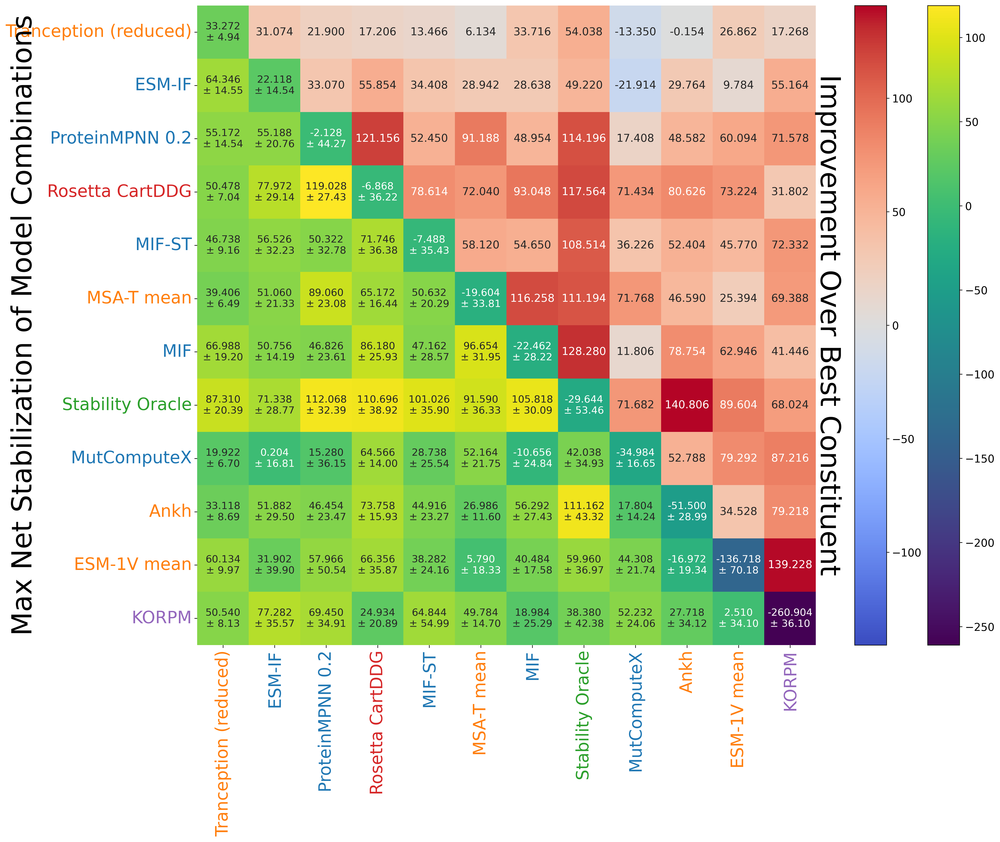

,model1,weight1,model2,weight2,mean_net_stabilization,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,mpnn_20_00_dir,0.5,119.028,0.005921
2,stability-oracle_dir,1,mpnn_20_00_dir,0.5,112.068,0.013509
3,stability-oracle_dir,1,ankh_dir,0.2,111.162,0.004561
4,stability-oracle_dir,1,cartesian_ddg_dir,1,110.696,0.000322
5,cartesian_ddg_dir,1,stability-oracle_dir,0.5,109.844,0.00005
...,...,...,...,...,...,...
326,korpm_dir,1,esmif_multimer_dir,0.2,-81.118,0.001269
327,korpm_dir,1,stability-oracle_dir,0.2,-114.93,0.041773
328,korpm_dir,1,cartesian_ddg_dir,0.2,-127.77,0.001451


In [26]:
measurement = 'ddG'
statistic = 'net_stabilization'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db[['ddG']], statistic, measurement, n_bootstraps=5, upper=upper, subset=subset2)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
#stat_df.loc[stat_df['runtime_gpu']<0, 'runtime_gpu'] = np.nan
stat_df

# ~ 10 seconds

### Supplementary Figure 8

0.0013924680652412


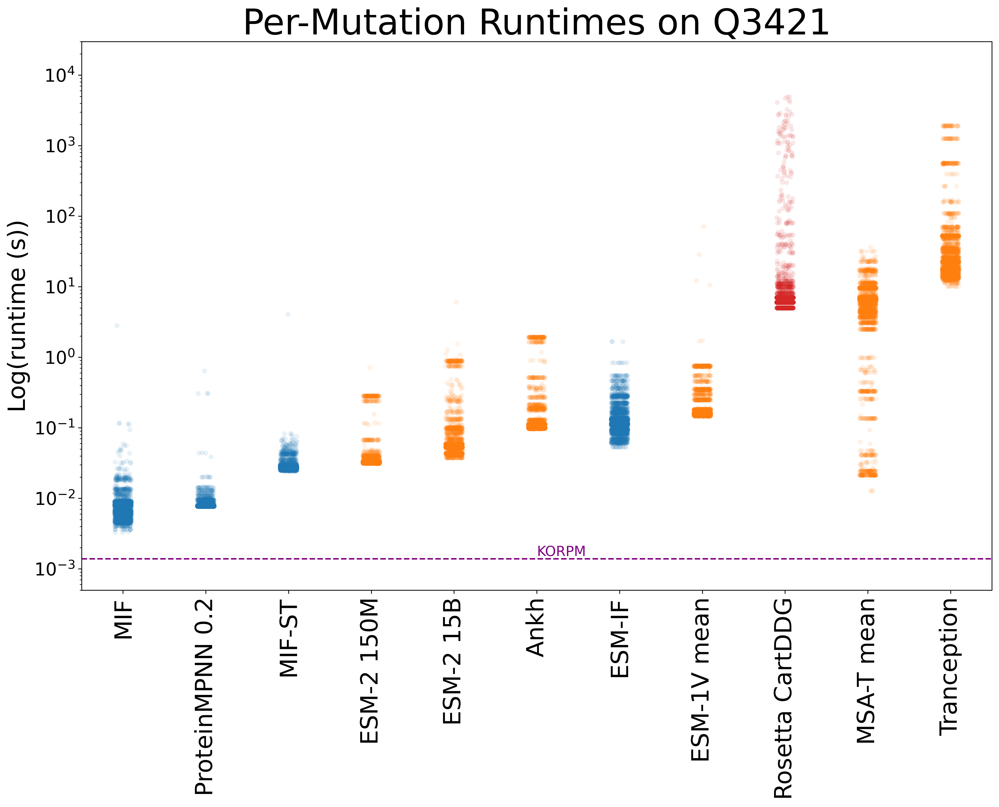

In [27]:
int_runtimes = db_runtimes.dropna(axis=1, how='all')#.groupby('code').mean()#.sum() #uncomment to get mean per protein
int_runtimes = int_runtimes[[
                             'runtime_esmif_multimer_dir',
                             'runtime_mif_dir',
                             'runtime_mifst_dir',
                             'runtime_mpnn_20_00_dir',
                             'runtime_tranception_weights_dir',
                             'runtime_msa_transformer_mean_dir',
                             'runtime_esm1v_mean_dir',
                             'runtime_esm2_150M_dir',
                             'runtime_cartesian_ddg_dir',
                             'runtime_ankh_dir',
                             'runtime_esm2_15B_half_dir',
                             'runtime_korpm_dir'
                            ]]

int_runtimes.columns = [c[8:-4] for c in int_runtimes.columns]
#int_runtimes.columns = int_runtimes.columns.map(analysis_utils.remap_names)
total_runtimes = int_runtimes.melt().sort_values('value')#.sum(axis=0)

### determine order for displaying runtimes
# Calculate the grouped median
grouped_median = total_runtimes.groupby('variable')['value'].median()
# Create a temporary column 'group_median' with the grouped medians mapped to each row
total_runtimes['group_median'] = total_runtimes['variable'].map(grouped_median)
# Sort the DataFrame first by 'group_median' and then by 'variable'
df_sorted = total_runtimes.sort_values(['group_median', 'variable'], ascending=True)
# Drop the temporary column 'group_median'
total_runtimes = df_sorted.drop(columns=['group_median'])
korpm_time = total_runtimes.loc[total_runtimes['variable']=='korpm', 'value'].mean()
print(korpm_time)
total_runtimes = total_runtimes.loc[total_runtimes['variable']!='korpm']

total_runtimes['category'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_category(x))
total_runtimes['color'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_base_color(x))

custom_palette = [
    (0.12156863, 0.46666667, 0.70588235),  # blue
    (1.0, 0.49803922, 0.05490196),  # orange
    (0.8392156862745098, 0.153, 0.153)  # red
]

# Set the custom palette
sns.set_palette(custom_palette)

fig, ax = plt.subplots(figsize=(1.5*total_runtimes['variable'].nunique(), 10), dpi=300)  # adjust the size here
ax = sns.stripplot(data=total_runtimes, x='variable', y='value', hue='color', alpha=0.1, legend=False)

plt.axhline(y=korpm_time, color='purple', linestyle='--', label='KORPM')
plt.text(5, korpm_time, 'KORPM', color='purple', verticalalignment='bottom')

remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
ax.set_xticklabels(remapped_x)
ax.set_yticklabels(remapped_x[::-1])
plt.title('Per-Mutation Runtimes on Q3421', fontsize=36)
plt.yscale('log')
plt.ylim(0.0005, 30000)
plt.xticks(rotation=90, fontsize=24)
plt.xlabel('')
plt.yticks(fontsize=18)
plt.ylabel('Log(runtime (s))', fontsize=24)
plt.show()

### Following cells relate to preprocessing required for Supplementary Figure 2

### Supplementary Figure 2

[ 5.59485531e-01  5.00000000e-01  4.67018470e-01  0.00000000e+00
 -9.03538256e-06  0.00000000e+00 -5.43614752e-04]


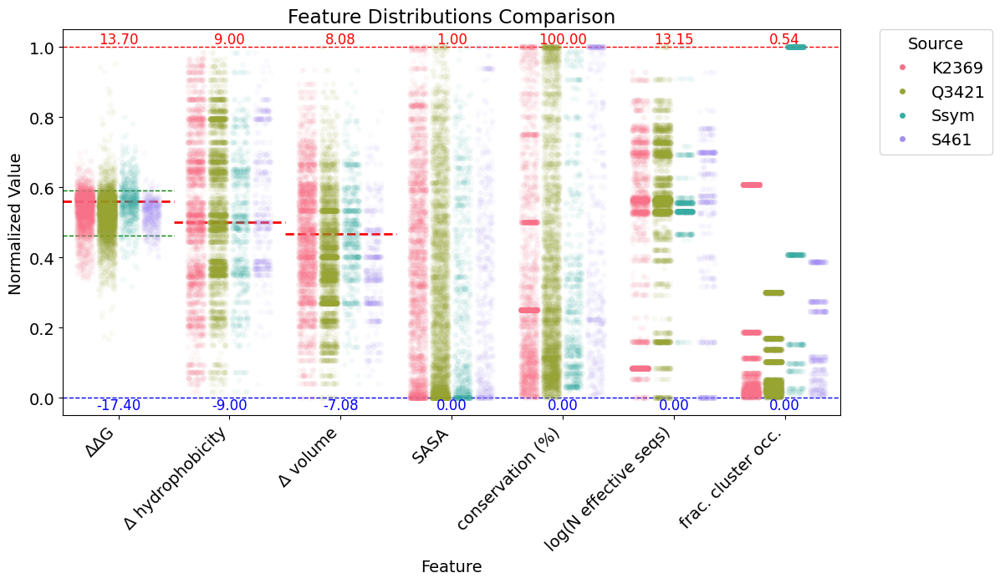

In [28]:
import importlib
importlib.reload(analysis_utils)

#db = pd.read_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv'))
s461_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))
ssym_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv'))
ssym_feats = ssym_feats.rename({'delta_kdh':'delta_kdh_dir', 'delta_vol':'delta_vol_dir', 'rel_ASA':'rel_ASA_dir'}, axis=1)
korpm_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 'k2369_analysis.csv'))

#compare_distributions_violin(db_feats_2.drop(['n_seqs', 'on_interface', 'column_completeness', 'saltbrs'], axis=1).join(db_ddg), s461_feats, shared_columns=['delta_kdh', 'delta_vol', 'rel_ASA', 'conservation', 'ddG'])
analysis_utils.compare_distributions_boxes([korpm_feats,db,ssym_feats,s461_feats], shared_columns=['ddG', 'delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'conservation', 'log_neff'], sources=['K2369', 'Q3421', 'Ssym', 'S461'])
#analysis_utils.compare_distributions_violin(db, korpm_feats, shared_columns=['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'conservation', 'log_neff', 'ddG'], source1='Q3421', label_adjust=0.25)

### Figure 5 (Methods)

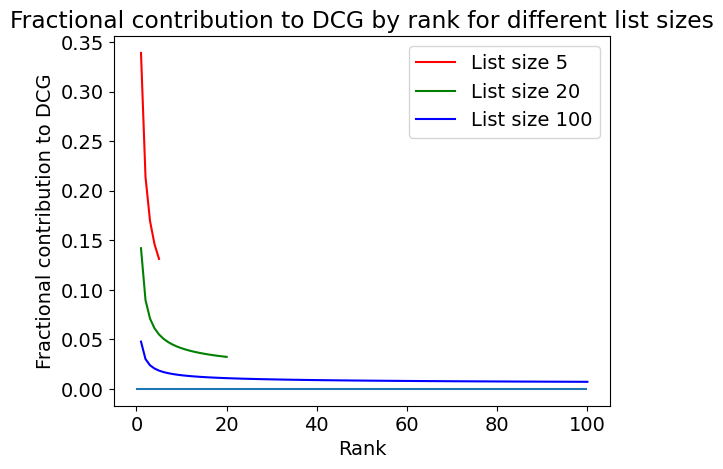

In [29]:
import matplotlib.pyplot as plt
import numpy as np

def fractional_contributions(list_size, base=2):
    ranks = np.arange(1, list_size+1)
    discounts = 1 / np.log2(ranks + 1)  # compute the discount for each rank
    return discounts / np.sum(discounts)  # normalize to get fractional contributions

list_sizes = [5, 20, 100]
colors = ['r', 'g', 'b']

for i, list_size in enumerate(list_sizes):
    fractions = fractional_contributions(list_size)
    plt.plot(np.arange(1, list_size+1), fractions, color=colors[i], label=f'List size {list_size}')

plt.xlabel('Rank')
plt.ylabel('Fractional contribution to DCG')
plt.title('Fractional contribution to DCG by rank for different list sizes')
plt.hlines(0, 0, 100)
plt.legend()
plt.show()